In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import imutils
from imutils import contours

In [12]:
def preprocess(img_path, gray=False):

    img = cv2.imread(img_path)
    if gray == False:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    elif gray == True:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    return img


def show(img):

    plt.figure(figsize=(20,10))

    l = len(img.shape)

    if l == 2:
        plt.imshow(img, cmap='gray')

    else:
        plt.imshow(img)

    plt.show()


def sort_contours(cnts, method="left-to-right"):
	# initialize the reverse flag and sort index
	reverse = False
	i = 0
	# handle if we need to sort in reverse
	if method == "right-to-left" or method == "bottom-to-top":
		reverse = True
	# handle if we are sorting against the y-coordinate rather than
	# the x-coordinate of the bounding box
	if method == "top-to-bottom" or method == "bottom-to-top":
		i = 1
	# construct the list of bounding boxes and sort them from top to
	# bottom
	boundingBoxes = [cv2.boundingRect(c) for c in cnts]
	(cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes),
		key=lambda b:b[1][i], reverse=reverse))
	# return the list of sorted contours and bounding boxes
	return (cnts, boundingBoxes)

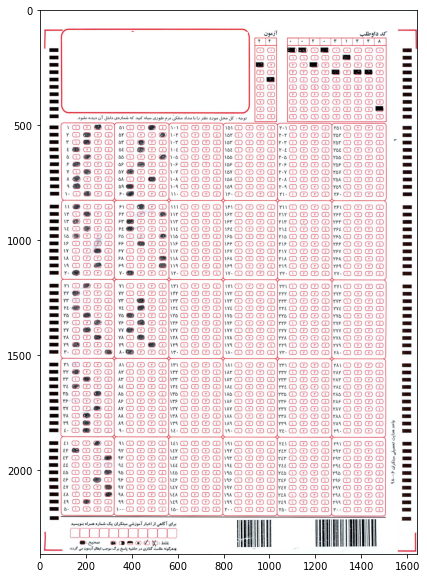

In [13]:
gray_img = preprocess('/home/mkh/Files/portfolio/omr/a.jpg', gray=True)
img = preprocess('/home/mkh/Files/portfolio/omr/a.jpg')
show(img)

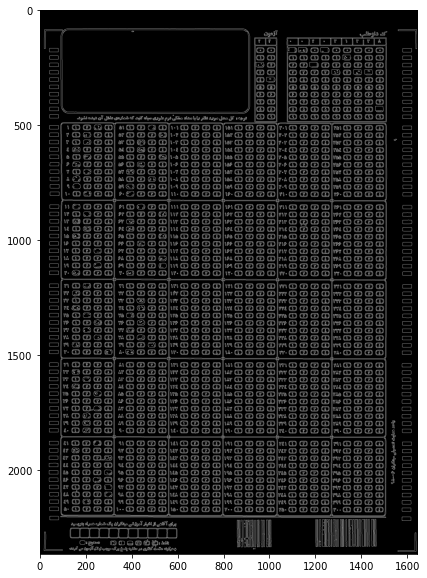

In [14]:
# image = cv2.imread(args["image"])
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray_img, (5,5), 0)
edged = cv2.Canny(blurred, 75, 200)
show(edged)

In [15]:
cnts = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

cnts = imutils.grab_contours(cnts)
docCnt = None
# ensure that at least one contour was found
if len(cnts) > 0:
	# sort the contours according to their size in
	# descending order
	cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
	# loop over the sorted contours
	for c in cnts:
		# approximate the contour
		peri = cv2.arcLength(c, True)
		approx = cv2.approxPolyDP(c, 0.02 * peri, True)
		# if our approximated contour has four points,
		# then we can assume we have found the paper
		if len(approx) == 4:
			docCnt = approx
			break

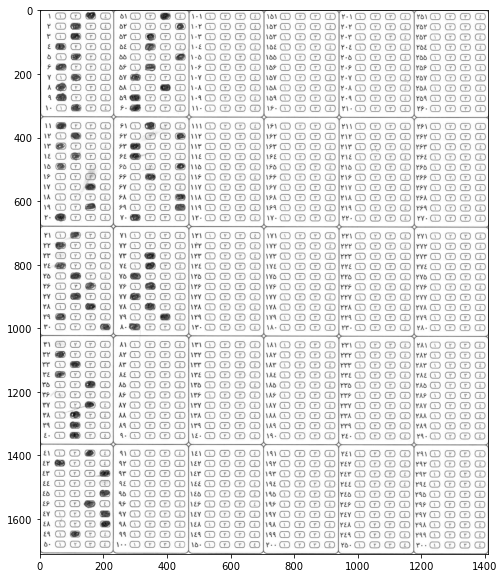

In [16]:
# for i in range(len(docCnt)):
points = docCnt.reshape(4,2)

xs = points[:,0]
ys = points[:,1]

top_left_x = min(xs)
top_left_y = min(ys)
bot_right_x = max(xs)
bot_right_y = max(ys)

croped = gray_img[top_left_y:bot_right_y+1, top_left_x:bot_right_x+1]
show(croped)

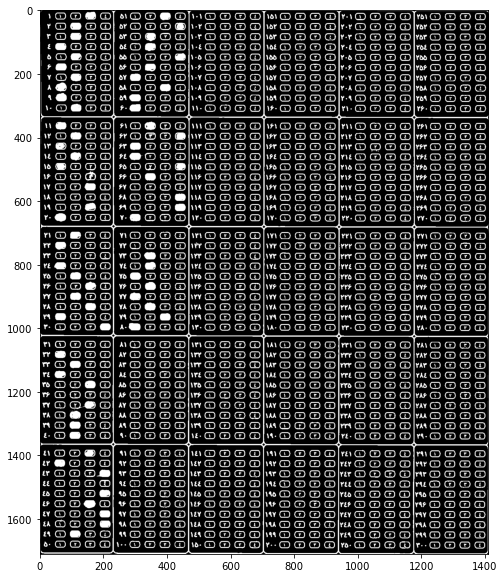

In [17]:
croped2 = cv2.GaussianBlur(croped.copy(), (3,3), 2)
thresh = cv2.threshold(croped2, 0, 255,cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
show(thresh)

In [18]:
# find contours in the thresholded image, then initialize
# the list of contours that correspond to questions
cnts, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
# print(np.unique(np.array(hierarchy[0][:,-1])))
# cnts = [c[0] for c in zip(cnts, hierarchy[0]) if c[1][3] < 100]

# cnts = imutils.grab_contours(cnts)
questionCnts = []
# loop over the contours
for c in cnts:
    # compute the bounding box of the contour, then use the
    # bounding box to derive the aspect ratio
    (x, y, w, h) = cv2.boundingRect(c)
    ar = w / float(h)

    # in order to label the contour as a question, region
    # should be sufficiently wide, sufficiently tall, and
    # have an aspect ratio approximately equal to 1
    if w >= 20 and h >= 20 and ar >= 1. and ar <= 2.:
    	questionCnts.append(c)

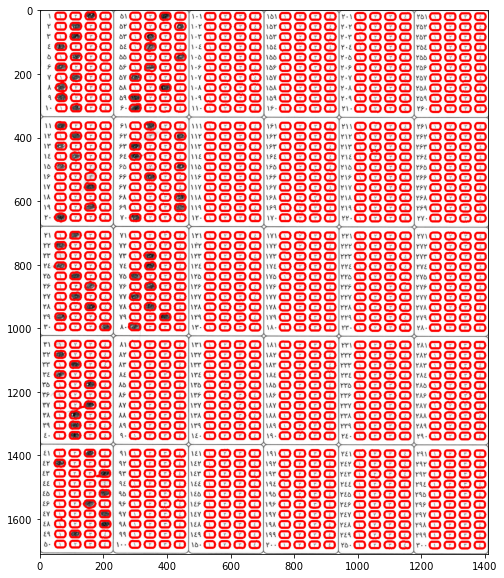

In [19]:
croped2 = cv2.cvtColor(croped.copy(), cv2.COLOR_GRAY2RGB)
cv2.drawContours(croped2, questionCnts, -1, (255,0,0), 5)
show(croped2)

In [230]:
# croped2 = cv2.cvtColor(croped.copy(), cv2.COLOR_GRAY2RGB)
# sort the question contours top-to-bottom, then initialize
# the total number of correct answers
# questionCnts = contours.sort_contours(questionCnts,method="top-to-bottom")[0]
qc = sort_contours(questionCnts, method='top-to-bottom')[0]
# print(qc)
correct = 0
# each question has 5 possible answers, to loop over the
# question in batches of 5
for (q, i) in enumerate(np.arange(0, len(qc), 4)):

	if q%2 == 0:
		color=(255,0,0)
	else:
		color=(0,0,255)
	# sort the contours for the current question from
	# left to right, then initialize the index of the
	# bubbled answer
	cnts = contours.sort_contours(qc[i:i + 4])[0]
	bubbled = None

# 	cv2.drawContours(croped2, cnts, -1, color, 5)
# show(croped2)

In [231]:
# for i in range(0,300,50):
    # print(i)

# len(questionCnts)

In [20]:
# croped2 = cv2.cvtColor(croped.copy(), cv2.COLOR_GRAY2RGB)
croped2 = croped.copy()
c = 0
# color=(255,0,0)
sheet = np.zeros((4,300))
ch=0
s=0

for j in range(0,1200,50):
    
    qc = contours.sort_contours(questionCnts,method="lef-to-right")[0]
    qc = contours.sort_contours(qc[j:j+50],method="top-to-bottom")[0]
    # questionCnts = sorted(questionCnts)
    # qc = questionCnts# sort_contours(questionCnts, method='top-to-bottom')[0]
    
    # recs = []
    # x1s = []
    # y1s = []
    # x2s = []
    # y2s = []

    for ind,i in enumerate(qc):

        c+=1
        cnt = np.squeeze(i, 1)
        xs = cnt[:,0]
        ys = cnt[:,1]

        top_left_x = min(xs)
        top_left_y = min(ys)
        bot_right_x = max(xs)
        bot_right_y = max(ys)

        # recs.append((top_left_x, top_left_y, bot_right_x, bot_right_y))
        # x1s.append(top_left_x)
        # y1s.append(top_left_y)
        # x2s.append(bot_right_x)
        # y2s.append(bot_right_y)

        ans = cv2.threshold(croped2[top_left_y:bot_right_y+1, top_left_x:bot_right_x+1], 0, 255,cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        # show(ans)
        total = cv2.countNonZero(ans)
        # print(total)
        # print(ind+(50*s), ch)
        if total > 300:
            sheet[ch, ind+(50*s)] = 1

        # print(type(croped2[top_left_y:bot_right_y+1, top_left_x:bot_right_x+1][0,0,0]))
        # cv2.rectangle(croped2, (top_left_x, top_left_y), (bot_right_x, bot_right_y), color, 3)

        # if c%50 == 0:
        #     if color==(255,0,0):
        #         color=(0,0,255)
        #     else:
        #         color=(255,0,0)
    if ch < 3:
        ch+=1
    else:
        ch = 0
        s+=1

# show(croped2)

In [21]:
choices = []
for i in range(300):

    opt = np.where(sheet[:,i] == 1.0)[0]
    if len(opt) > 0:
        choice = opt[0]+1
    else:
        choice = None

    choices.append(choice)

print(choices)

[3, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 2, 1, 2, 1, None, 3, None, 3, 1, 2, 1, None, 1, 2, 3, 2, 3, 1, 4, None, 1, 2, 1, 3, None, 3, 2, 2, 2, 3, 1, 4, None, 4, 3, 4, 4, 2, None, 3, 4, 2, 2, 4, 2, 1, 3, 1, 1, 2, 4, 1, 1, 4, 2, None, 4, 4, 1, None, None, 2, 2, 1, 2, 1, 2, 3, 1, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, Non

In [177]:
for i in range(300):
    print(np.argmax(sheet[:,i])+1)

3
2
2
1
2
1
2
1
1
2
1
2
1
2
1
1
3
1
3
1
2
1
1
1
2
3
2
3
1
4
1
1
2
1
3
1
3
2
2
2
3
1
4
1
4
3
4
4
2
1
3
4
2
2
4
2
1
3
1
1
2
4
1
1
4
2
1
4
4
1
1
1
2
2
1
2
1
2
3
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [84]:
croped2 = cv2.cvtColor(croped.copy(), cv2.COLOR_GRAY2RGB)

for x in sorted(x1s):
    cv2.circle()

([45,
  45,
  45,
  45,
  45,
  45,
  45,
  45,
  45,
  46,
  46,
  46,
  46,
  46,
  46,
  46,
  46,
  47,
  47,
  47,
  47,
  47,
  47,
  47,
  47,
  47,
  47,
  47,
  47,
  48,
  48,
  48,
  48,
  48,
  48,
  48,
  48,
  48,
  48,
  48,
  48,
  48,
  48,
  49,
  49,
  49,
  49,
  49,
  49,
  50],
 [92,
  92,
  92,
  92,
  92,
  93,
  93,
  93,
  93,
  93,
  93,
  93,
  93,
  93,
  94,
  94,
  94,
  94,
  94,
  94,
  94,
  94,
  94,
  94,
  94,
  94,
  94,
  95,
  95,
  95,
  95,
  95,
  95,
  95,
  95,
  95,
  95,
  95,
  95,
  96,
  96,
  96,
  96,
  96,
  96,
  96,
  96,
  96,
  97,
  97])

In [78]:
sorted(y1s[:24]), sorted(y1s[24:48]), sorted(y1s[48:72])

([5, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10],
 [40,
  40,
  40,
  40,
  40,
  40,
  40,
  40,
  41,
  41,
  41,
  41,
  41,
  41,
  41,
  41,
  41,
  41,
  42,
  42,
  42,
  42,
  42,
  42],
 [72,
  72,
  72,
  72,
  72,
  72,
  72,
  73,
  73,
  73,
  73,
  73,
  73,
  73,
  73,
  73,
  73,
  74,
  74,
  74,
  74,
  74,
  74,
  74])

In [13]:
for i,cor in enumerate(recs):
    x1 = cor[0]
    y1 = cor[1]
    x2 = cor[2]
    y2 = cor[3]

    

(187, 1668, 220, 1689)
(141, 1668, 173, 1689)
(94, 1668, 127, 1689)
(47, 1668, 80, 1689)
(188, 1636, 221, 1658)
(140, 1636, 174, 1657)
(94, 1636, 127, 1657)
(47, 1636, 80, 1657)
(188, 1605, 221, 1626)
(140, 1605, 174, 1626)
(93, 1604, 126, 1626)
(47, 1600, 79, 1626)
(187, 1573, 220, 1594)
(140, 1573, 173, 1594)
(93, 1573, 126, 1594)
(46, 1573, 79, 1594)
(187, 1541, 220, 1562)
(137, 1541, 174, 1565)
(93, 1541, 126, 1562)
(45, 1541, 79, 1562)
(140, 1509, 173, 1530)
(92, 1509, 125, 1530)
(45, 1509, 78, 1530)
(187, 1508, 220, 1530)
(187, 1477, 220, 1498)
(140, 1477, 173, 1498)
(92, 1477, 125, 1498)
(45, 1477, 78, 1498)
(178, 1445, 220, 1467)
(139, 1445, 173, 1467)
(92, 1445, 125, 1467)
(45, 1445, 78, 1466)
(187, 1414, 220, 1435)
(140, 1414, 173, 1435)
(92, 1414, 125, 1435)
(45, 1413, 78, 1435)
(187, 1382, 221, 1403)
(140, 1382, 173, 1403)
(92, 1382, 126, 1403)
(45, 1381, 78, 1403)
(188, 1326, 221, 1347)
(140, 1326, 174, 1347)
(93, 1326, 127, 1347)
(45, 1326, 79, 1347)
(188, 1294, 221, 1316

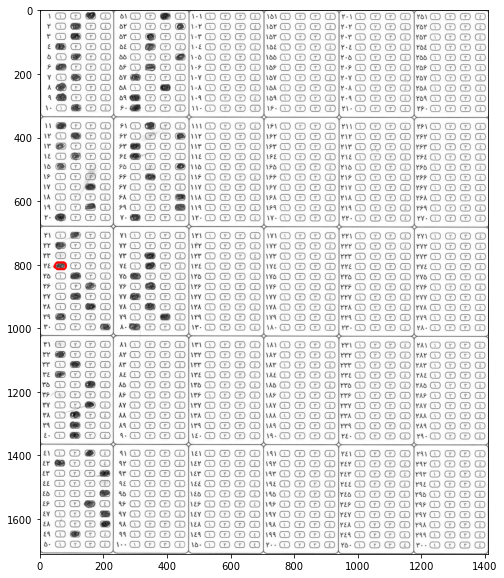

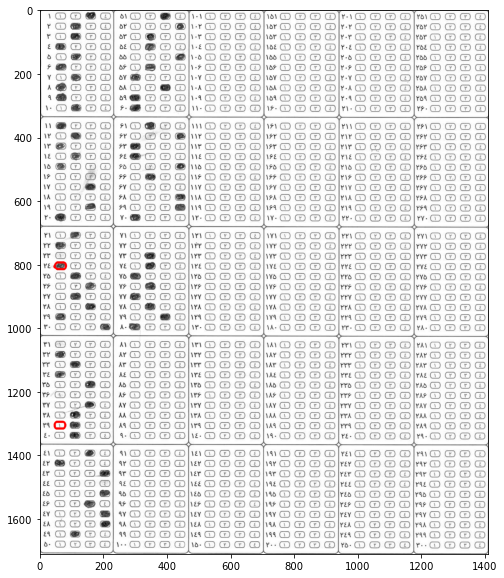

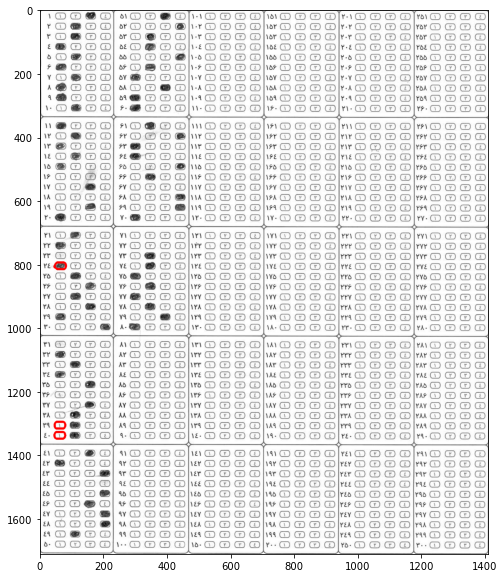

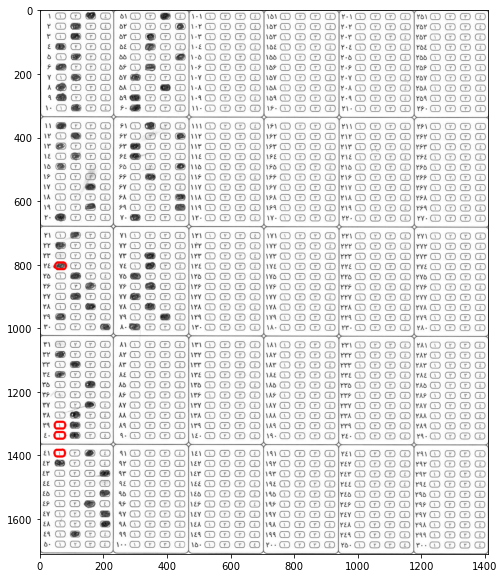

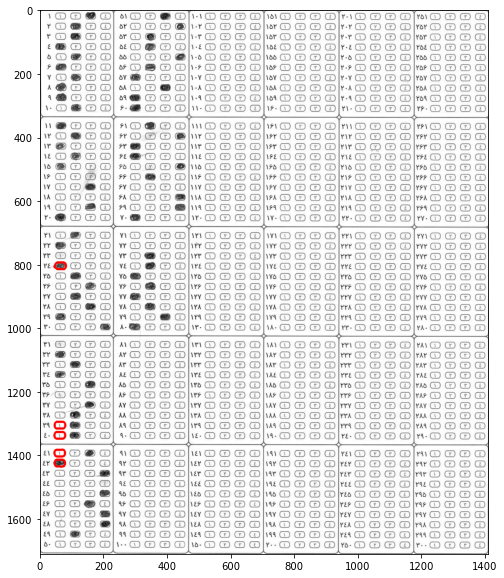

...

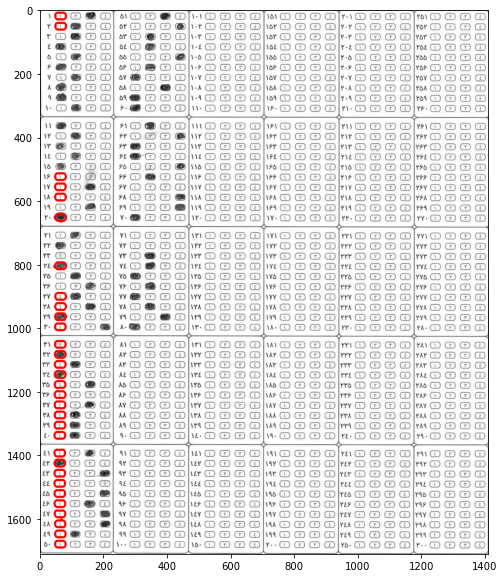

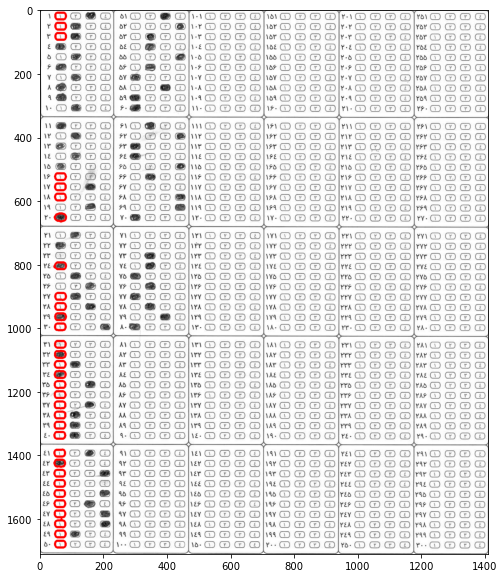

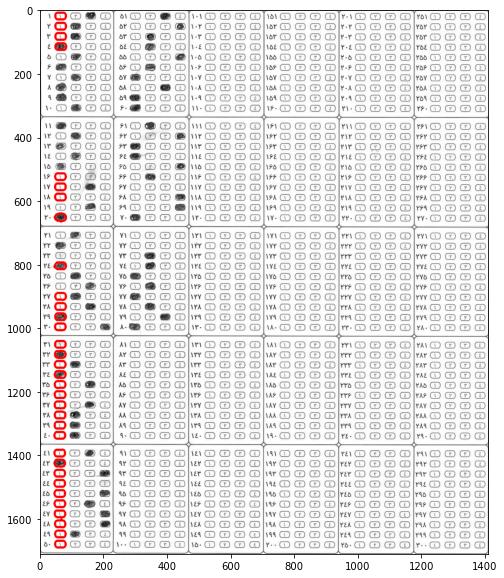

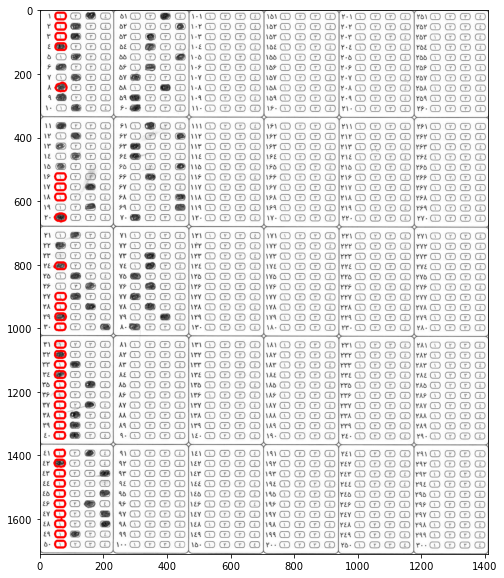

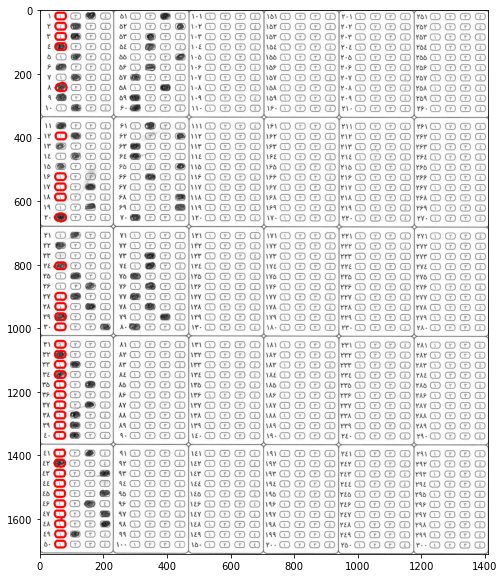

KeyboardInterrupt: 

In [38]:
croped2 = cv2.cvtColor(croped.copy(), cv2.COLOR_GRAY2RGB)

cnts, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
sorted_cnts = contours.sort_contours(contours.sort_contours(questionCnts,method="top-to-bottom")[0],method="left-to-right")[0]
for i in sorted_cnts:

    cv2.drawContours(croped2, i, -1, color, 5)
    show(croped2)

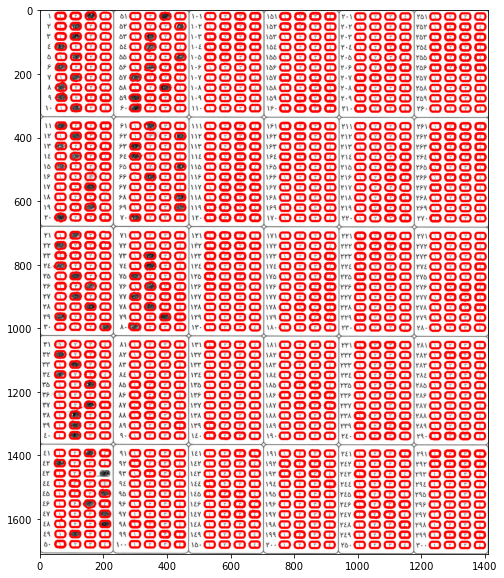

In [176]:
croped2 = cv2.cvtColor(croped.copy(), cv2.COLOR_GRAY2RGB)
cv2.drawContours(croped2, questionCnts, -1, (255,0,0), 5)
show(croped2)